In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# pd.set_option('display.max_colwidth', -1)
import matplotlib.pyplot as plt
from matplotlib import rcParams
import re
from wordcloud import WordCloud
from collections import Counter
import csv
from matplotlib import rcParams
from nltk.corpus import stopwords
import nltk
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,plot_confusion_matrix
from google.colab import drive
drive.mount('/gdrive')
#Change current working directory to gdrive
%cd /gdrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive


Data Source: https://www.kaggle.com/clmentbisaillon/fake-and-real-news-dataset

In [3]:
fake = pd.read_csv("/gdrive/My Drive/Fake.csv")
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [4]:
true= pd.read_csv("/gdrive/My Drive/True.csv")
true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [5]:
fake.groupby(['subject']).count()

,title,text,date
subject,,,
Government News,1570,1570,1570
Middle-east,778,778,778
News,9050,9050,9050
US_News,783,783,783
left-news,4459,4459,4459
politics,6841,6841,6841


In [6]:
true.subject.value_counts()

politicsNews    11272
worldnews       10145
Name: subject, dtype: int64

EDA PART

In [8]:
fake.isnull().sum()

title      0
text       0
subject    0
date       0
dtype: int64

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


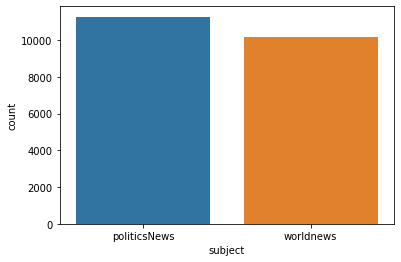

In [10]:
import seaborn as sns
sns.countplot(x='subject', data = true)
plt.show()

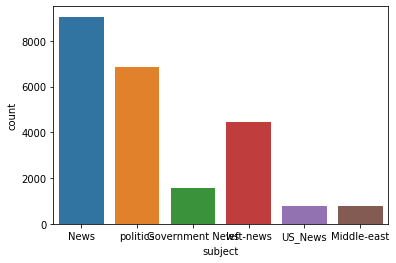

In [11]:
sns.countplot(x='subject', data = fake)
plt.show()

The above graphs show that target column is not equally distributed in False category and News label is more than other labels
Sepearting the dataset into the different dataframe based on the label column

In [15]:
politics = true[true['subject']=="politicsNews"]
worldnews = true[true['subject']=="worldnews"]
politics.shape

(11272, 4)

In [16]:
worldnews.shape

(10145, 4)

In [17]:
fake['length'] = fake['text'].apply(len)
fake.head()

,title,text,subject,date,length
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",2893
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",1898
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",3597
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",2774
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",2346


In [21]:
true['length'] = true['text'].apply(len)
true.head()

,title,text,subject,date,length
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",4659
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",4077
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",2789
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",2461
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",5204


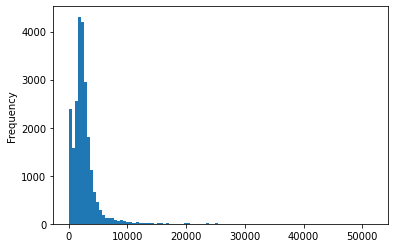

In [18]:
fake['length'].plot(bins=100, kind='hist')

In [19]:
fake.length.describe()

count    23481.000000
mean      2547.396235
std       2532.884399
min          1.000000
25%       1433.000000
50%       2166.000000
75%       3032.000000
max      51794.000000
Name: length, dtype: float64

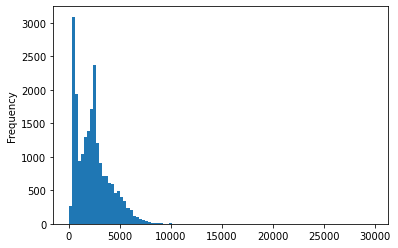

In [22]:
true['length'].plot(bins=100, kind='hist')

In [23]:
true[true['subject']=="politicsNews"].length.describe()

count    11272.000000
mean      2549.489975
std       1783.180372
min          1.000000
25%        960.000000
50%       2409.000000
75%       3571.500000
max      29781.000000
Name: length, dtype: float64

In [25]:
true[true['subject']=="worldnews"].length.describe()

count    10145.000000
mean      2198.602760
std       1547.640725
min        152.000000
25%        887.000000
50%       1980.000000
75%       2980.000000
max      17999.000000
Name: length, dtype: float64

Toekenization: basically refers to splitting up a larger body of text into smaller lines, words or even creating words for a non-English language.Here we are performing the word tokenization from NLTK Library

In [26]:
def preprocess(text):   
    # lower case
    text = text.lower()                        
    tokens = nltk.word_tokenize(text) 
    # taken only words (not punctuation)
    token_words = [w for w in tokens if w.isalpha()]                 
    # remove stop words
    stop = stopwords.words('english')
    meaningful_words = [w for w in token_words if not w in stop]
    joined_words = ( " ".join(meaningful_words))
    return joined_words


In [29]:
nltk.download('punkt')
nltk.download('stopwords')
politics['text'] = politics['text'].apply(preprocess)
worldnews['text'] = worldnews['text'].apply(preprocess)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [30]:
def generate_word_cloud(text):
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

For TRUE data file

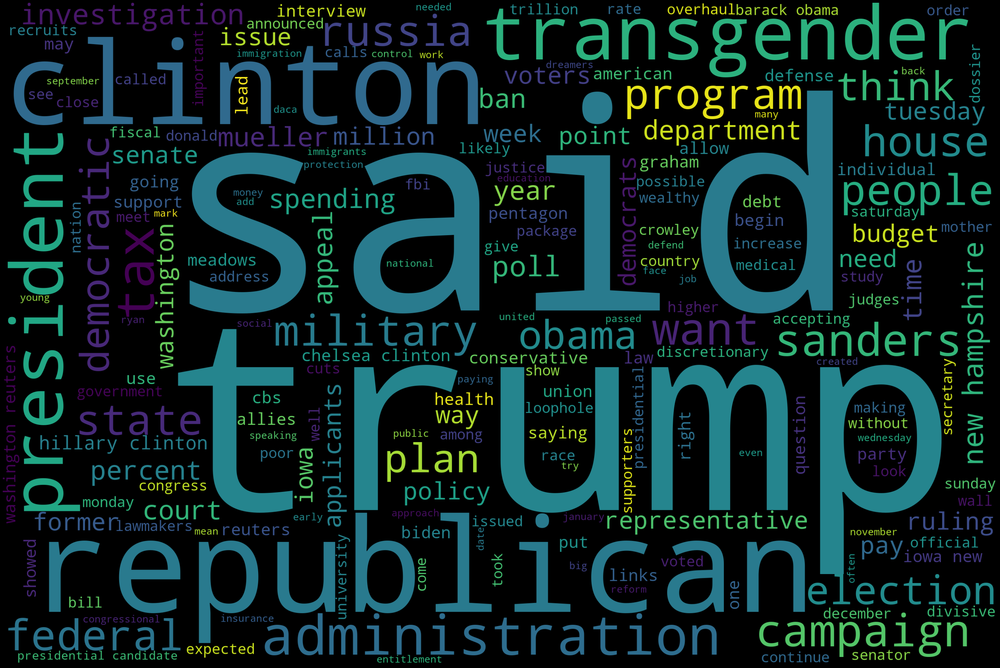

In [31]:
politics_text = politics.text.values
generate_word_cloud(politics_text)

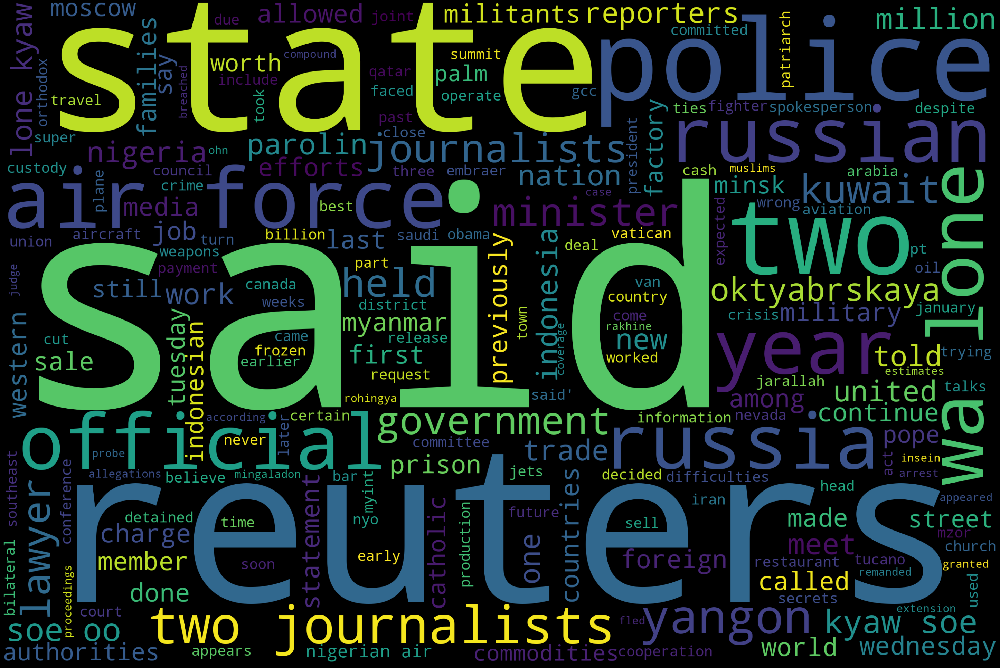

In [32]:
worldnews_text = worldnews.text.values
generate_word_cloud(worldnews_text)

For FAKE data file

In [34]:
set(fake.subject)

{'Government News', 'Middle-east', 'News', 'US_News', 'left-news', 'politics'}

In [35]:
Government_News = fake[fake['subject']=="Government News"]
Middle_east = fake[fake['subject']=="Middle-east"]
News = fake[fake['subject']=="News"]
US_News = fake[fake['subject']=="US_News"]
politics = fake[fake['subject']=="politics"]

In [36]:
Government_News['text'] = Government_News['text'].apply(preprocess)
Middle_east['text'] = Middle_east['text'].apply(preprocess)
News['text'] = News['text'].apply(preprocess)
US_News['text'] = US_News['text'].apply(preprocess)
politics['text'] = politics['text'].apply(preprocess)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

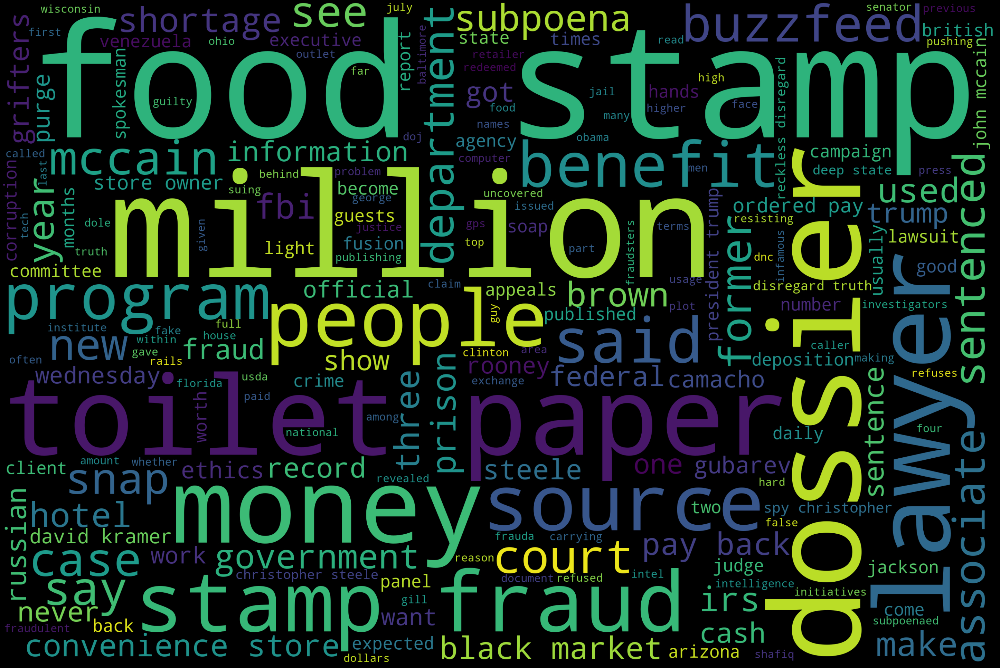

In [37]:
govertment_news_text = Government_News['text'].values
generate_word_cloud(govertment_news_text)

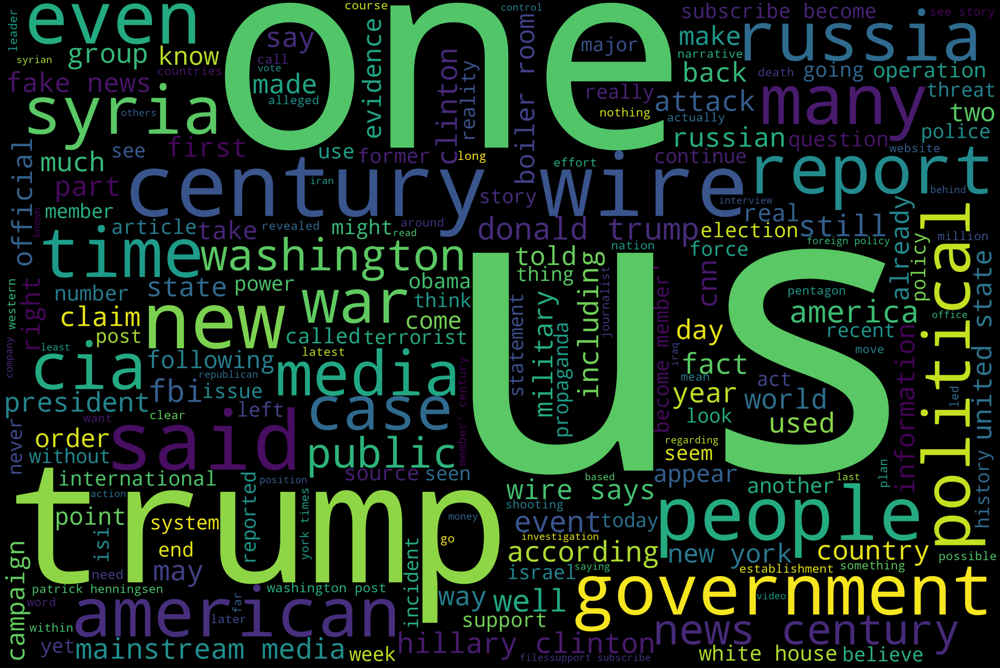

In [38]:
middleast_news_text = Middle_east['text'].values
generate_word_cloud(middleast_news_text)

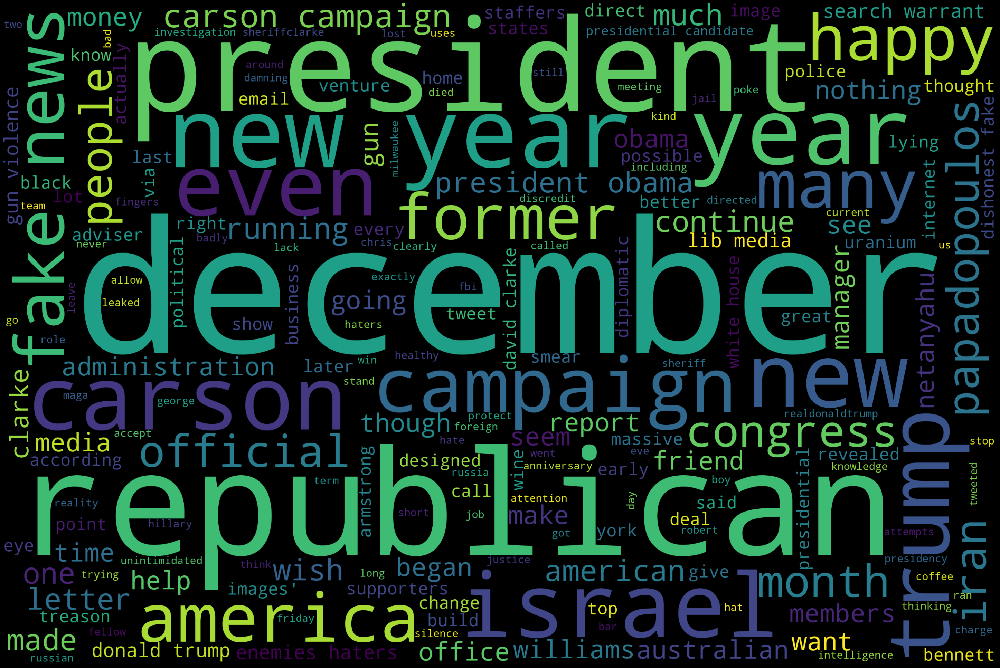

In [39]:
news_text = News['text'].values
generate_word_cloud(news_text)

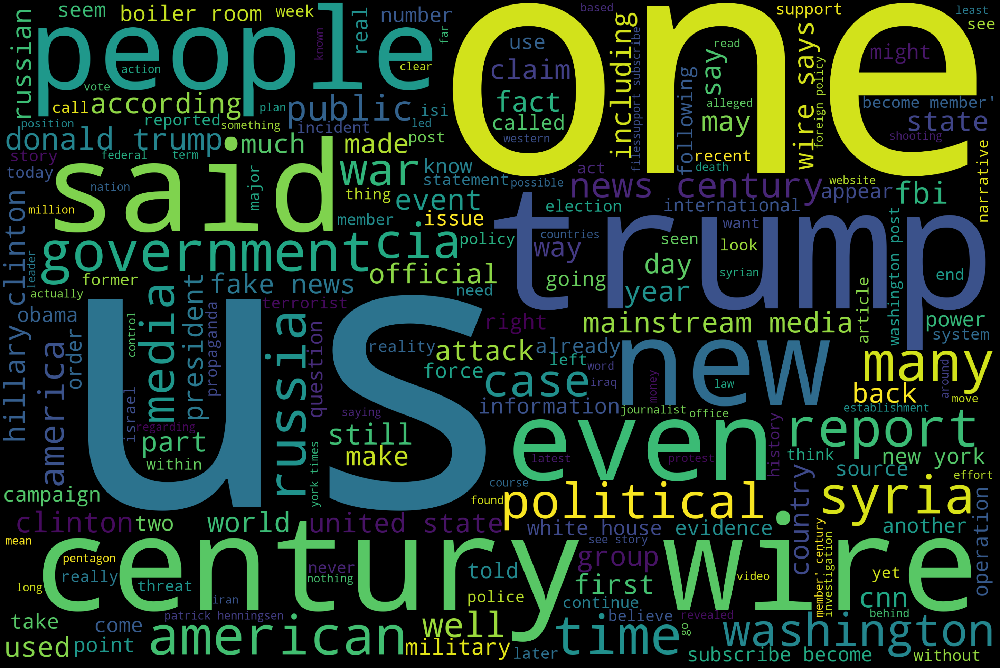

In [40]:
usnews_text = US_News['text'].values
generate_word_cloud(usnews_text)

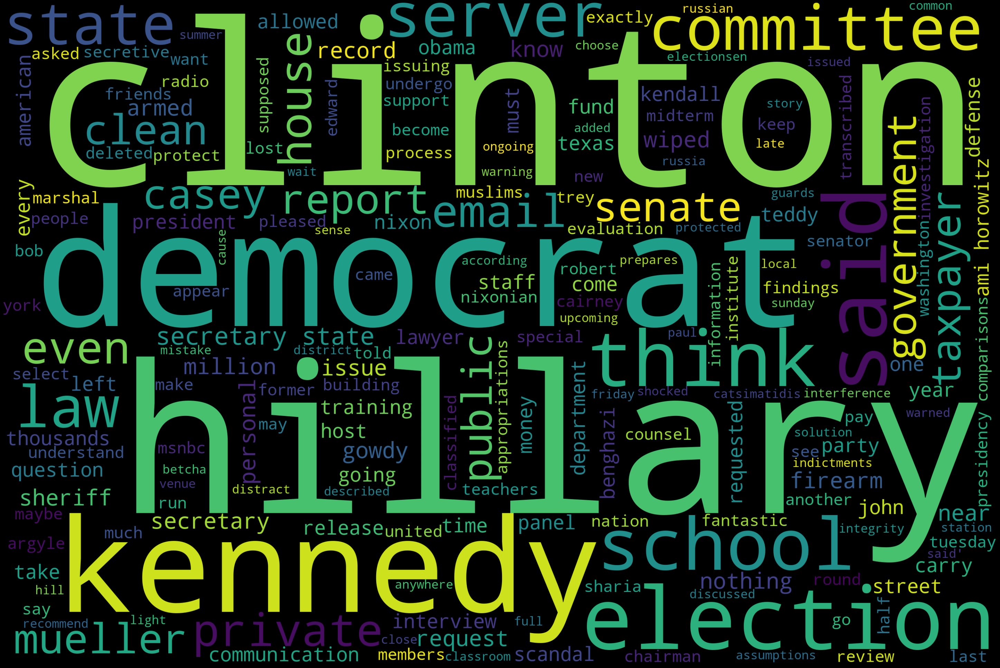

In [41]:
politicsFake_text = politics['text'].values
generate_word_cloud(politicsFake_text)

Now we come to modeling

In [42]:
true["T/F"] = 'T'
fake["T/F"] = 'F'

In [43]:
df = pd.concat([fake, true]).reset_index(drop = True)
df.head()

,title,text,subject,date,length,T/F
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",2893,F
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",1898,F
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",3597,F
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",2774,F
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",2346,F


In [44]:
df.shape

(44898, 6)

In [45]:
df['text'] = df['text'].apply((lambda y:re.sub("http://\S+"," ", y)))
df['text'] = df['text'].apply((lambda x:re.sub("\@", " ",x.lower())))

In [46]:
df.head()

,title,text,subject,date,length,T/F
0,Donald Trump Sends Out Embarrassing New Year’...,donald trump just couldn t wish all americans ...,News,"December 31, 2017",2893,F
1,Drunk Bragging Trump Staffer Started Russian ...,house intelligence committee chairman devin nu...,News,"December 31, 2017",1898,F
2,Sheriff David Clarke Becomes An Internet Joke...,"on friday, it was revealed that former milwauk...",News,"December 30, 2017",3597,F
3,Trump Is So Obsessed He Even Has Obama’s Name...,"on christmas day, donald trump announced that ...",News,"December 29, 2017",2774,F
4,Pope Francis Just Called Out Donald Trump Dur...,pope francis used his annual christmas day mes...,News,"December 25, 2017",2346,F


In [48]:
def basic_clean(text):
  """
  A simple function to clean up the data. All the words that
  are not designated as a stop word is then lemmatized after
  encoding and basic regex parsing are performed.
  """
  wnl = nltk.stem.WordNetLemmatizer()
  stopwords = nltk.corpus.stopwords.words('english')
  words = re.sub(r'[^\w\s]', '', text).split()
  return [wnl.lemmatize(word) for word in words if word not in stopwords]

In [50]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [51]:
true_word = basic_clean(''.join(str(true['text'].tolist())))

N-Gram
In the fields of computational linguistics and probability, an n-gram is a contiguous sequence of n items from a given sample of text or speech. The items can be phonemes, syllables, letters, words or base pairs according to the application. The n-grams typically are collected from a text or speech corpus. When the items are words, n-grams may also be called shingles

For True
Bigram

Text(0.5, 0, '# of Occurances')

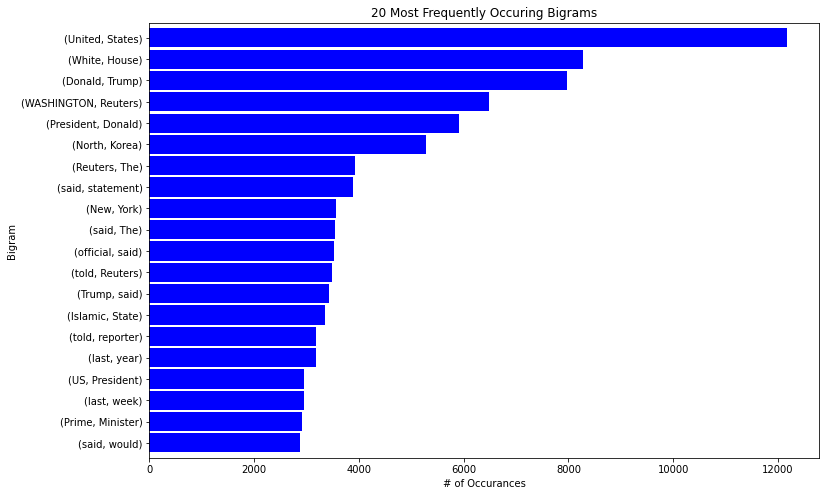

In [52]:
true_bigrams_series = (pd.Series(nltk.ngrams(true_word, 2)).value_counts())[:20]
true_bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

For True Trigram


Text(0.5, 0, '# of Occurances')

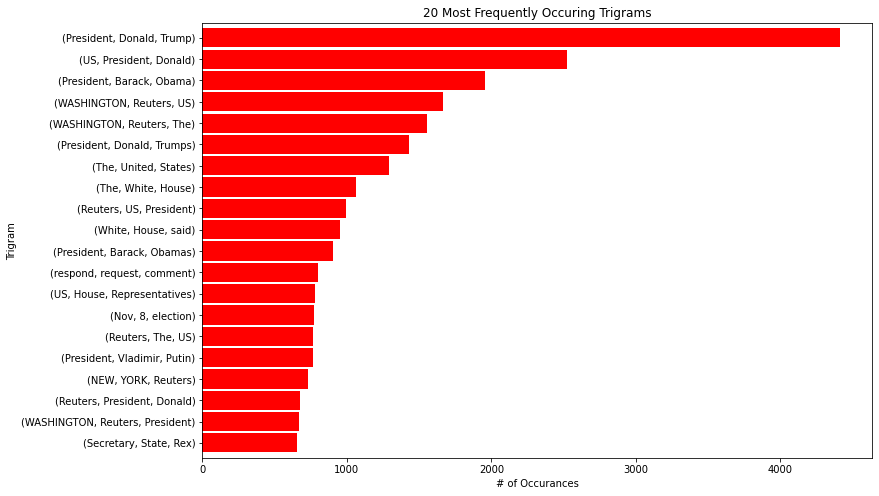

In [53]:
true_trigrams_series = (pd.Series(nltk.ngrams(true_word, 3)).value_counts())[:20]
true_trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

For Fake Bigram

In [55]:
fake_word = basic_clean(''.join(str(fake['text'].tolist())))
fake_bigrams_series = (pd.Series(nltk.ngrams(fake_word, 2)).value_counts())[:20]

Text(0.5, 0, '# of Occurances')

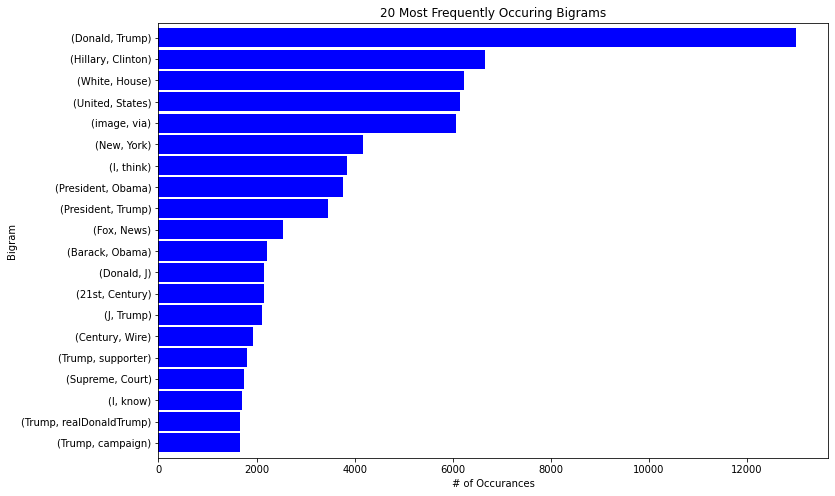

In [57]:
fake_bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

Trigram

Text(0.5, 0, '# of Occurances')

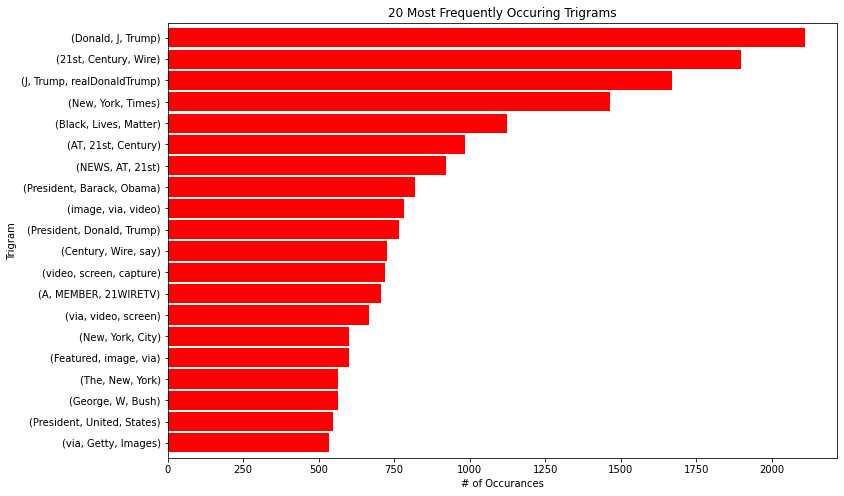

In [58]:
fake_trigrams_series = (pd.Series(nltk.ngrams(fake_word, 3)).value_counts())[:20]
fake_trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

Then we do same for whole data

In [59]:
words = basic_clean(''.join(str(df['text'].tolist())))
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:20]

Text(0.5, 0, '# of Occurances')

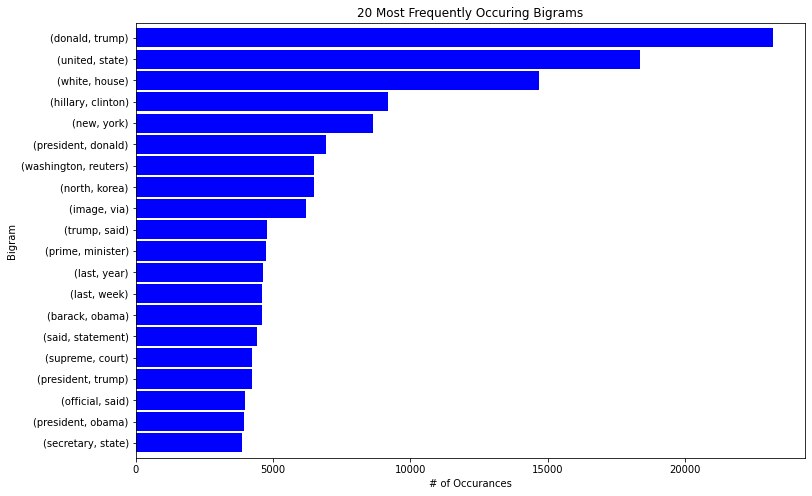

In [60]:
bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

Text(0.5, 0, '# of Occurances')

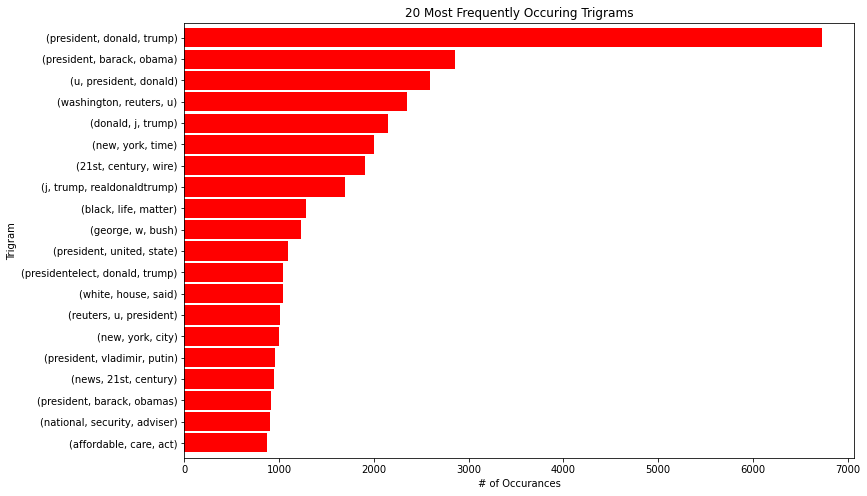

In [61]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:20]
trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

Then we do training and testing prediction

In [64]:
from sklearn.naive_bayes import MultinomialNB
x_train,x_test,y_train,y_test = train_test_split(df['text'], df['T/F'], test_size=0.2, random_state=1234)

pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB(
        alpha=1.0, # laplace add-one smoothing
        fit_prior=True, # learn class prior-probabilities from data
        class_prior=None # none - go with whatever fit-prior says
    ))])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 93.66%


In [65]:
print(confusion_matrix(y_test, prediction))
print(classification_report(y_test, prediction))

[[4493  255]
 [ 314 3918]]
              precision    recall  f1-score   support

           F       0.93      0.95      0.94      4748
           T       0.94      0.93      0.93      4232

    accuracy                           0.94      8980
   macro avg       0.94      0.94      0.94      8980
weighted avg       0.94      0.94      0.94      8980

